# UAV-informed Vineyard Coverage Path Planning — Results

This notebook **runs the end-to-end pipeline** (`run_pipeline.py`) with flags and
then visualises / aggregates its outputs. All reporting code (plots, statistics)
lives here; `run_pipeline.py` only computes and saves raw results.

Two datasets:
* **`data`**  — cropped multispectral orthomosaic (NIR/RE/R/G/NDVI) + DEM.
* **`data2`** — an OpenDroneMap multispectral orthophoto (no DEM), fed through the
  `prepare_odm.py` adapter.

**Reproduce / add a dataset:** `python run_pipeline.py --name <ds> --config <paths.txt> --method all --k 3`

In [1]:
import os, glob, subprocess, sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.lines import Line2D
from scipy.ndimage import binary_dilation, label as cc_label
from sklearn.metrics import (silhouette_score, davies_bouldin_score,
                             calinski_harabasz_score)
from IPython.display import display

from mission_planner import (field_mask, target_mask, _sweep_segments,
                             order_swaths_snake, generate_zone_swaths, slope_degrees)

plt.rcParams.update({"figure.dpi": 110, "axes.titlesize": 12, "font.size": 10})
CACHE, COMPARE, FIG = "cache", "compare", "figures"
os.makedirs(FIG, exist_ok=True)
ZONE_COLORS = ["#2b2b2b", "#d73027", "#fee08b", "#66bd63", "#1a9850"]
VIGOR = {1: "Low vigor", 2: "Medium vigor", 3: "High vigor", 4: "Very high vigor"}


def run_pipeline(name, config, method="all", k=3):
    """Invoke the end-to-end pipeline as a concrete full run with flags."""
    cmd = [sys.executable, "run_pipeline.py", "--name", name, "--config", config,
           "--method", method, "--k", str(k)]
    print("$ " + " ".join(cmd))
    r = subprocess.run(cmd, capture_output=True, text=True)
    tail = "\n".join(l for l in r.stdout.splitlines()
                     if not any(s in l for s in ("Deprecation", "new view", "s.read")))
    print(tail[-1500:])
    if r.returncode:
        print("STDERR:", r.stderr[-1500:])

## Run the pipeline for both datasets
(This is the actual `run_pipeline.py` command being executed with flags.)

In [2]:
run_pipeline("data", "paths.txt", method="all", k=3)
run_pipeline("data2", "paths_data2.txt", method="all", k=3)

$ C:\Users\jryma\Studia\Polimi\Path_covering\POLIMI_ARNOLD_COVERAGE_PATH_PLANNING\07_08_pipeline_combined\venv\Scripts\python.exe run_pipeline.py --name data --config paths.txt --method all --k 3


 RUN PIPELINE — dataset 'data', method 'all', K=3
[1/4] Loading rasters from paths.txt ...
      preview 2063x2681 | vegetation 421913 px | pixel ~= 0.066 m
[2/4] Clustering ...
      K-Means              zones [102796, 162310, 156807]
      Mini-Batch K-Means   zones [112167, 163058, 146688]
      GMM                  zones [67681, 205738, 148494]
      Agglomerative        zones [132794, 206103, 83016]
      Spectral             zones [108622, 222103, 91188]
      Fuzzy C-Means        SKIPPED (ModuleNotFoundError: No module named 'skfuzzy')
[3/4] Path planning ...
      water     mission: 22335 segments
      nitrogen  mission: 16379 segments
[4/4] Saving outputs ...

Done. cache -> C:\Users\jryma\Studia\Polimi\Path_covering\POLIMI_ARNOLD_COVERAGE_PATH_PLANNING\07_08_pipeline_combined\cache\data
      compare -> C:\Users\jryma\Studia\Polimi\Path_covering\POLIMI_ARNOLD_COVERAGE_PATH_PLANNING\07_08_pipeline_combined\compare\data
$ C:\Users\jryma\Studia\Polimi\Path_covering\POLIMI_ARNOL

 RUN PIPELINE — dataset 'data2', method 'all', K=3
[1/4] Loading rasters from paths_data2.txt ...
      preview 286x344 | vegetation 49472 px | pixel ~= 0.350 m
[2/4] Clustering ...
      K-Means              zones [23245, 19791, 6436]
      Mini-Batch K-Means   zones [23256, 19555, 6661]
      GMM                  zones [28484, 7165, 13823]
      Agglomerative        zones [22406, 21624, 5442]
      Spectral             zones [23304, 5125, 21043]
      Fuzzy C-Means        SKIPPED (ModuleNotFoundError: No module named 'skfuzzy')
[3/4] Path planning ...
      water     mission: 703 segments
      nitrogen  mission: 667 segments
[4/4] Saving outputs ...
      no DEM -> slope / A* elevation stage disabled

Done. cache -> C:\Users\jryma\Studia\Polimi\Path_covering\POLIMI_ARNOLD_COVERAGE_PATH_PLANNING\07_08_pipeline_combined\cache\data2
      compare -> C:\Users\jryma\Studia\Polimi\Path_covering\POLIMI_ARNOLD_COVERAGE_PATH_PLANNING\07_08_pipeline_combined\compare\data2


## Reporting helpers (visualisation + statistics — notebook only)

In [3]:
def load_ds(name):
    c = os.path.join(CACHE, name)
    ds = {"name": name,
          "zones": np.load(f"{c}/preview_map.npy"),
          "ndre": np.load(f"{c}/ndre_preview.npy"),
          "ndvi": np.load(f"{c}/ndvi_preview.npy"),
          "base": np.load(f"{c}/false_colour.npy"),
          "X": np.load(f"{c}/features_X.npy"),
          "veg": np.load(f"{c}/veg.npy"),
          "meta": np.load(f"{c}/meta.npz", allow_pickle=True)}
    ds["dem"] = np.load(f"{c}/dem_preview.npy") if os.path.exists(f"{c}/dem_preview.npy") else None
    ds["px"] = float(ds["meta"]["pixel_size_m"])
    ds["K"] = int(ds["meta"]["k"])
    ds["method"] = str(ds["meta"]["method"])
    ds["mission"] = {s: np.load(f"{c}/mission_{s}.npy") for s in ("water", "nitrogen")
                     if os.path.exists(f"{c}/mission_{s}.npy")}
    return ds


def zlegend(K, path=None, pc=None):
    h = [Line2D([0], [0], color=pc, lw=2, label=path)] if path else []
    return h + [Line2D([0], [0], marker="s", ls="", ms=11, mec="k",
                       markerfacecolor=ZONE_COLORS[z], label=f"Zone {z} — {VIGOR.get(z,'')}")
                for z in range(1, K + 1)]


def zone_overlay(ax, ds, alpha):
    K = ds["K"]
    zov = np.ma.masked_where(ds["zones"] == 0, ds["zones"])
    cmap = ListedColormap([ZONE_COLORS[z] for z in range(1, K + 1)])
    ax.imshow(zov, cmap=cmap, norm=BoundaryNorm(np.arange(1, K + 2) - 0.5, K),
              alpha=alpha, interpolation="nearest")


def show_zones(ds):
    fig, ax = plt.subplots(1, 2, figsize=(18, 7.5), constrained_layout=True)
    ax[0].imshow(ds["base"]); ax[0].set_title(f"False-colour orthophoto (NIR-R-G) — {ds['name']}")
    ax[1].imshow(ds["base"] * 0.4 + 0.05); zone_overlay(ax[1], ds, 0.85)
    ax[1].set_title(f"Management zones — {ds['method']} (K={ds['K']})")
    ax[1].legend(handles=zlegend(ds["K"]), loc="upper right", framealpha=0.9, fontsize=9)
    for a in ax: a.axis("off")
    fig.savefig(f"{FIG}/{ds['name']}_zones.png", bbox_inches="tight"); plt.show()


def zone_table(ds):
    K, z, ndre, ndvi, px = ds["K"], ds["zones"], ds["ndre"], ds["ndvi"], ds["px"]
    veg = z > 0
    rows = [{"Zone": zz, "Vigor": VIGOR.get(zz, ""), "Pixels": int((z == zz).sum()),
             "Area [ha]": (z == zz).sum() * px * px / 1e4,
             "% vegetation": 100 * (z == zz).sum() / max(1, veg.sum()),
             "Mean NDRE": float(ndre[z == zz].mean()) if (z == zz).any() else np.nan,
             "Mean NDVI": float(ndvi[z == zz].mean()) if (z == zz).any() else np.nan}
            for zz in range(1, K + 1)]
    df = pd.DataFrame(rows).set_index("Zone")
    display(df.style.format({"Area [ha]": "{:.3f}", "% vegetation": "{:.1f}",
                             "Mean NDRE": "{:.3f}", "Mean NDVI": "{:.3f}", "Pixels": "{:,}"})
            .set_caption(f"Per-zone statistics — {ds['name']} "
                         f"(total vegetation {veg.sum()*px*px/1e4:.2f} ha)"))


def show_mission(ds, supp, color):
    if supp not in ds["mission"]:
        return
    traj = ds["mission"][supp]
    fig, ax = plt.subplots(figsize=(12, 9))
    ax.imshow(ds["base"] * 0.4 + 0.05); zone_overlay(ax, ds, 0.35)
    for (x1, y1), (x2, y2) in traj:
        ax.plot([x1, x2], [y1, y2], color=color, lw=1.1, alpha=0.9, zorder=5)
    length = sum(np.hypot(x2 - x1, y2 - y1) for (x1, y1), (x2, y2) in traj) * ds["px"]
    ax.legend(handles=zlegend(ds["K"], "Robot path", color), loc="upper right", framealpha=0.9, fontsize=9)
    ax.set_title(f"Coverage path — {supp.upper()} — {ds['name']}")
    ax.axis("off")
    fig.savefig(f"{FIG}/{ds['name']}_{supp}.png", bbox_inches="tight"); plt.show()
    print(f"{supp.upper()}: {len(traj)} segments, driven length ~= {length:.0f} m")


def show_stages(ds):
    K, base, z = ds["K"], ds["base"], ds["zones"]
    fm = field_mask(z); tgt = target_mask(z, "water"); walk = fm & (z == 0)
    useful = walk & binary_dilation(tgt, iterations=8)
    sw = order_swaths_snake(_sweep_segments(useful, 4.0))
    cmap = ListedColormap(ZONE_COLORS[:K + 1]); norm = BoundaryNorm(np.arange(K + 2) - 0.5, K + 1)
    fig, ax = plt.subplots(2, 2, figsize=(15, 11), constrained_layout=True)
    ax[0, 0].imshow(z, cmap=cmap, norm=norm); ax[0, 0].set_title("1. Management zones")
    ax[0, 1].imshow(tgt, cmap="Greens"); ax[0, 1].set_title("2. Target mask (WATER = all vine zones)")
    ax[1, 0].imshow(useful, cmap="Oranges"); ax[1, 0].set_title("3. Drivable corridors near targets")
    ax[1, 1].imshow(base * 0.4 + 0.05)
    for (x1, y1), (x2, y2) in sw:
        ax[1, 1].plot([x1, x2], [y1, y2], color="#00e5ff", lw=1.0, alpha=0.9)
    ax[1, 1].set_title("4. Coverage swaths on corridors")
    for a in ax.ravel(): a.axis("off")
    fig.savefig(f"{FIG}/{ds['name']}_stages.png", bbox_inches="tight"); plt.show()


def _fragmentation(zmap, K):
    return 1000.0 * sum(cc_label(zmap == z)[1] for z in range(1, K + 1)) / max(1, (zmap > 0).sum())


def _coverage(zmap, supp, px, reach=8):
    sw = order_swaths_snake(generate_zone_swaths(zmap, supp, 4.0))
    cov = np.zeros(zmap.shape, bool); length = 0.0
    for (x1, y1), (x2, y2) in sw:
        cov[int(y1), int(min(x1, x2)):int(max(x1, x2)) + 1] = True; length += abs(x2 - x1)
    tgt = target_mask(zmap, supp)
    served = binary_dilation(cov, iterations=reach) & tgt
    return round(length * px), len(sw), round(100 * served.sum() / max(1, tgt.sum()), 1)


def method_comparison(name):
    """Aggregate clustering-quality and path-covering metrics for every method."""
    X = np.load(f"{CACHE}/{name}/features_X.npy")
    K = int(np.load(f"{CACHE}/{name}/meta.npz", allow_pickle=True)["k"])
    px = float(np.load(f"{CACHE}/{name}/meta.npz", allow_pickle=True)["pixel_size_m"])
    rng = np.random.RandomState(42); si = rng.choice(len(X), min(5000, len(X)), replace=False)
    clu, pth, maps = [], [], {}
    for lf in sorted(glob.glob(f"{COMPARE}/{name}/labels_*.npy")):
        m = os.path.basename(lf)[7:-4].replace("_", " ")
        labels = np.load(lf); zmap = np.load(f"{COMPARE}/{name}/zones_{m.replace(' ', '_')}.npy")
        maps[m] = zmap
        counts = np.bincount(labels, minlength=K)
        clu.append({"Method": m,
                    "Silhouette": round(silhouette_score(X[si], labels[si]), 3),
                    "Davies-Bouldin": round(davies_bouldin_score(X, labels), 3),
                    "Calinski-Harabasz": int(calinski_harabasz_score(X, labels)),
                    "Balance": round(counts.min() / max(1, counts.max()), 3),
                    "Fragmentation": round(_fragmentation(zmap, K), 2)})
        for supp in ("water", "nitrogen"):
            length, nsw, cov = _coverage(zmap, supp, px)
            pth.append({"Method": m, "Supplement": supp, "Swaths": nsw,
                        "Length [m]": length, "Coverage [%]": cov})
    clu = pd.DataFrame(clu).set_index("Method"); pth = pd.DataFrame(pth).set_index(["Method", "Supplement"])
    display(clu.style.set_caption(f"Clustering quality by method — {name}")
            .background_gradient(subset=["Silhouette", "Calinski-Harabasz"], cmap="Greens")
            .background_gradient(subset=["Davies-Bouldin", "Fragmentation"], cmap="Reds"))
    display(pth.style.set_caption(f"Path-covering metrics by method — {name}"))
    cmap = ListedColormap(ZONE_COLORS[:K + 1]); norm = BoundaryNorm(np.arange(K + 2) - 0.5, K + 1)
    names = list(maps); cols = 3; rows = int(np.ceil(len(names) / cols))
    fig, ax = plt.subplots(rows, cols, figsize=(5 * cols, 4 * rows))
    for a, mm in zip(np.array(ax).ravel(), names):
        a.imshow(maps[mm], cmap=cmap, norm=norm); a.set_title(mm); a.axis("off")
    for a in np.array(ax).ravel()[len(names):]: a.axis("off")
    fig.suptitle(f"Zone maps by clustering method — {name}", fontsize=13)
    fig.tight_layout(); plt.show()

---
# PART A — Dataset `data` (multispectral + DEM)

## A1. Management zones
Zone 1 = lowest vigor (red) … Zone K = highest (green). Zone 0 (soil / inter-row)
is drivable. Zones come from clustering a spatially smoothed vigor surface, so
they are contiguous management blocks, not per-pixel speckle.

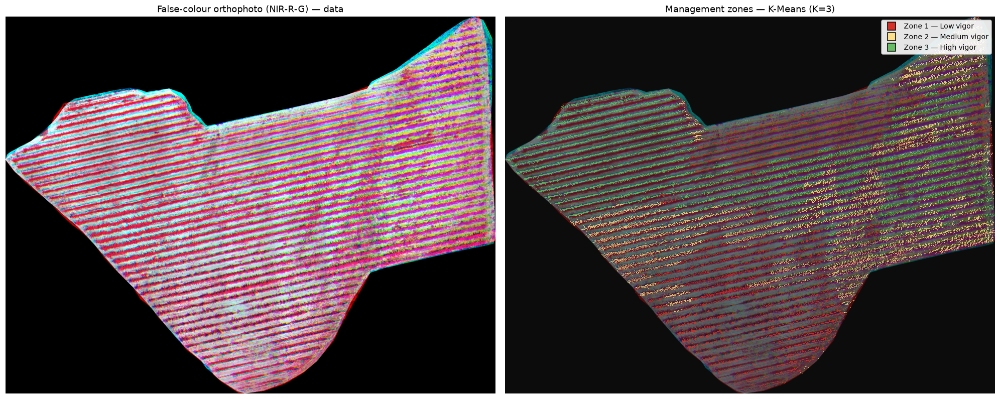

In [4]:
d1 = load_ds("data")
show_zones(d1)

## A2. Per-zone statistics — mean NDRE rises with the zone number (correct ordering)

In [5]:
zone_table(d1)

,Vigor,Pixels,Area [ha],% vegetation,Mean NDRE,Mean NDVI
Zone,,,,,,
1,Low vigor,"102,796",0.045,24.4,0.208,164.813
2,Medium vigor,"162,310",0.071,38.5,0.234,140.684
3,High vigor,"156,807",0.069,37.2,0.263,140.215


## A3. Topography and slope (DEM smoothed over ~2 m before the gradient)

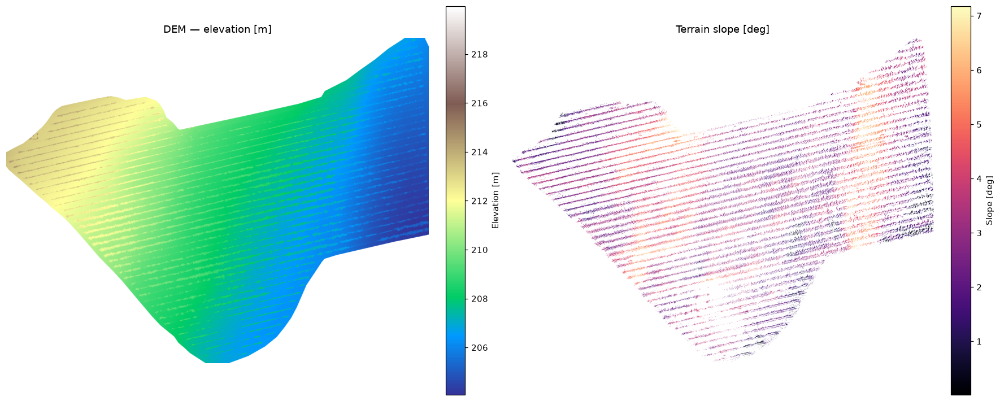

Slope inside field: median=3.1deg, 90th pct=4.9deg, max=7.2deg


In [6]:
if d1["dem"] is not None:
    dem = d1["dem"]; slope = slope_degrees(dem, d1["px"]); veg = d1["zones"] > 0
    fig, ax = plt.subplots(1, 2, figsize=(16, 6.5), constrained_layout=True)
    im = ax[0].imshow(np.ma.masked_where(dem <= 0, dem), cmap="terrain")
    ax[0].set_title("DEM — elevation [m]"); ax[0].axis("off")
    plt.colorbar(im, ax=ax[0], fraction=0.046, pad=0.04).set_label("Elevation [m]")
    im2 = ax[1].imshow(np.ma.masked_where(~veg, slope), cmap="magma")
    ax[1].set_title("Terrain slope [deg]"); ax[1].axis("off")
    plt.colorbar(im2, ax=ax[1], fraction=0.046, pad=0.04).set_label("Slope [deg]")
    fig.savefig(f"{FIG}/data_dem.png", bbox_inches="tight"); plt.show()
    print(f"Slope inside field: median={np.median(slope[veg]):.1f}deg, "
          f"90th pct={np.percentile(slope[veg],90):.1f}deg, max={slope[veg].max():.1f}deg")

## A4. How the clustering feeds the path planner
Zones → target zones for the supplement → drivable soil corridors → coverage swaths.

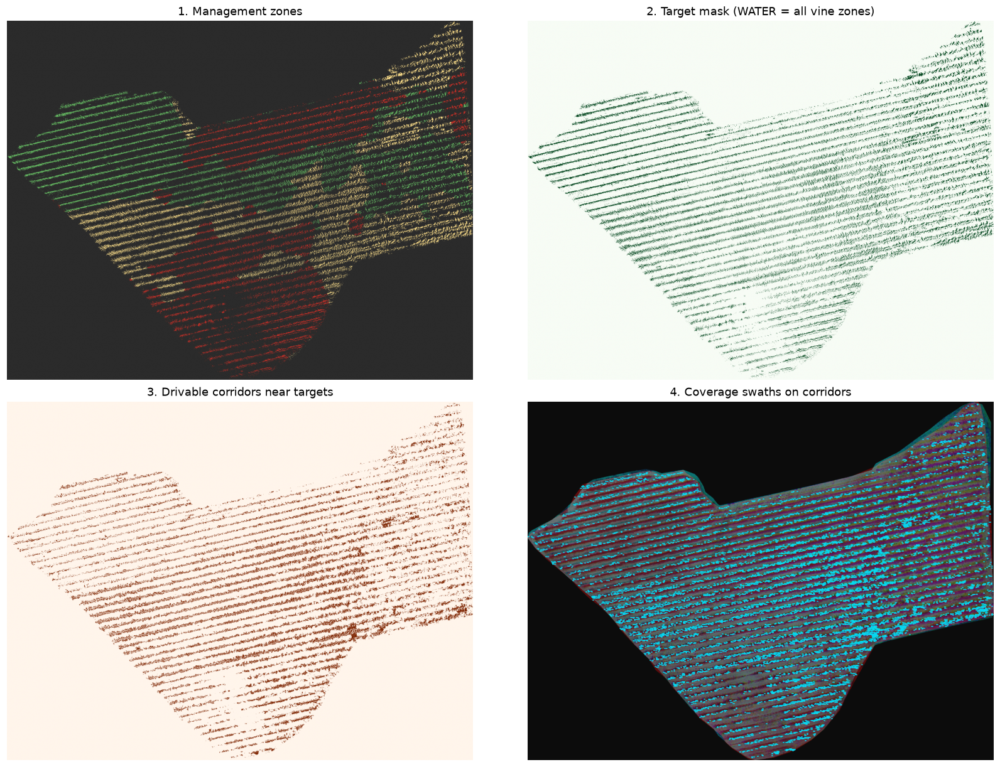

In [7]:
show_stages(d1)

## A5. Coverage path — WATER (treats every vine zone)

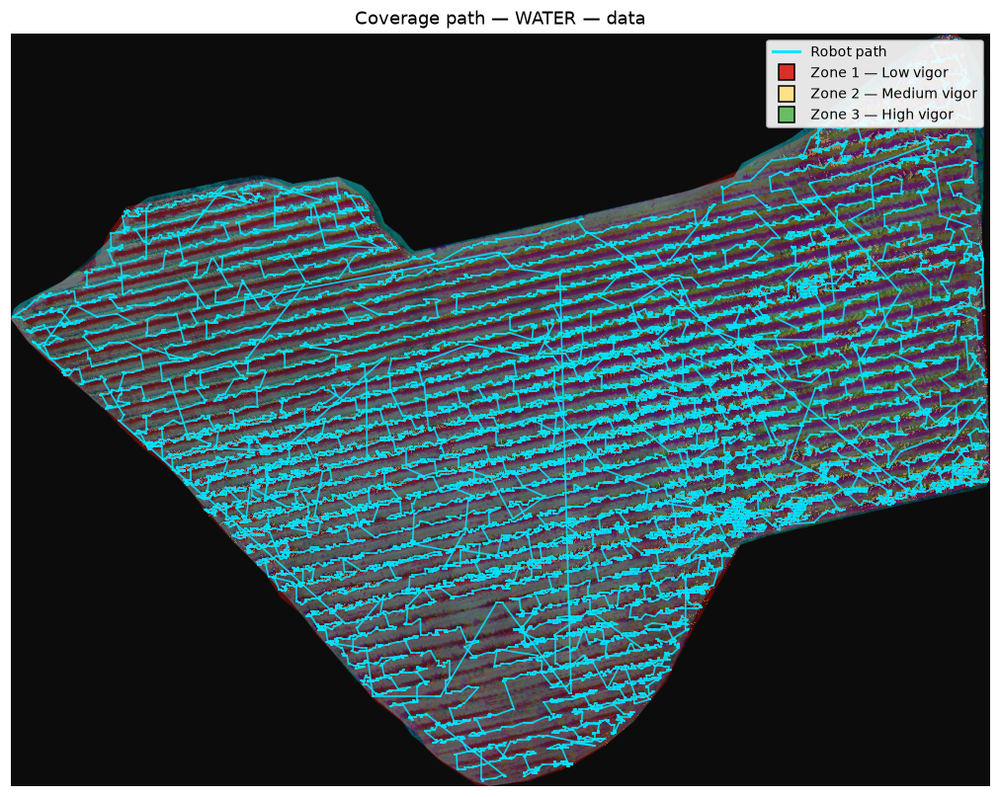

WATER: 22335 segments, driven length ~= 11489 m


In [8]:
show_mission(d1, "water", "#00e5ff")

## A6. Coverage path — NITROGEN (skips the highest-vigor zone)

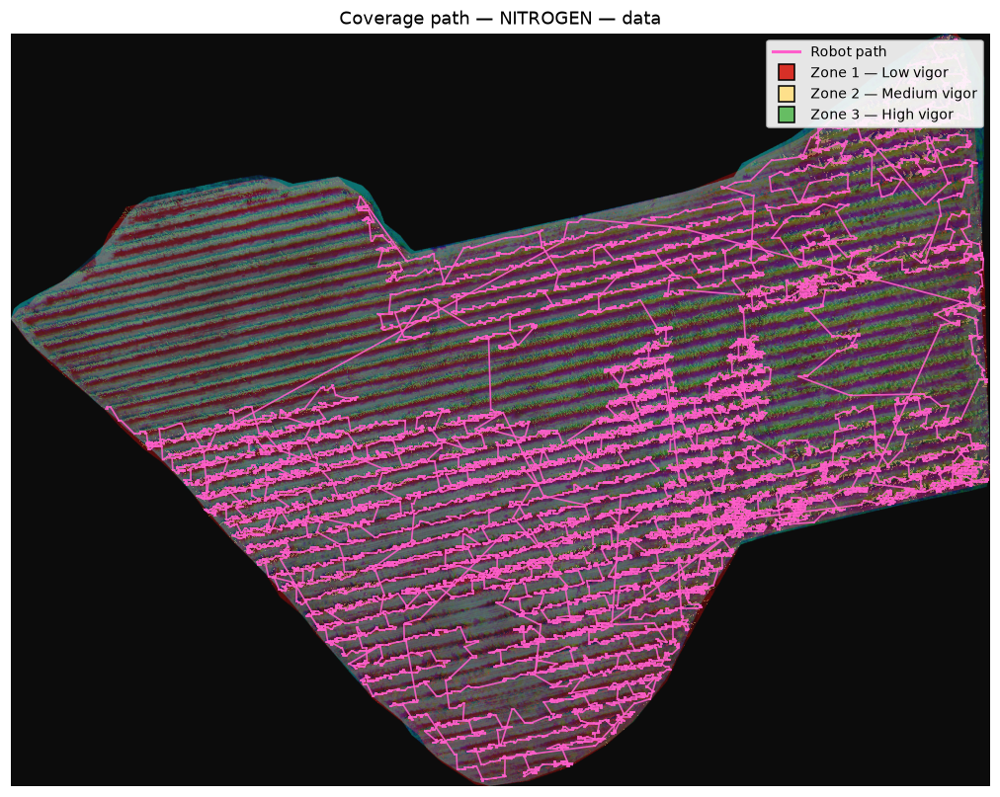

NITROGEN: 16379 segments, driven length ~= 8426 m


In [9]:
show_mission(d1, "nitrogen", "#ff5ecb")

## A7. Method comparison — clustering quality and path covering
`water` coverage is identical across methods (it targets *all* vine zones = the
same vegetation mask); `nitrogen` differs because each method draws the
highest-vigor zone differently.

,Silhouette,Davies-Bouldin,Calinski-Harabasz,Balance,Fragmentation
Method,,,,,
Agglomerative,0.259000,1.266000,157221,0.403000,89.260000
GMM,0.240000,1.493000,126342,0.329000,88.980000
K-Means,0.242000,1.352000,162998,0.633000,89.530000
Mini-Batch K-Means,0.240000,1.334000,162462,0.688000,89.670000
Spectral,0.224000,1.501000,117795,0.411000,88.650000


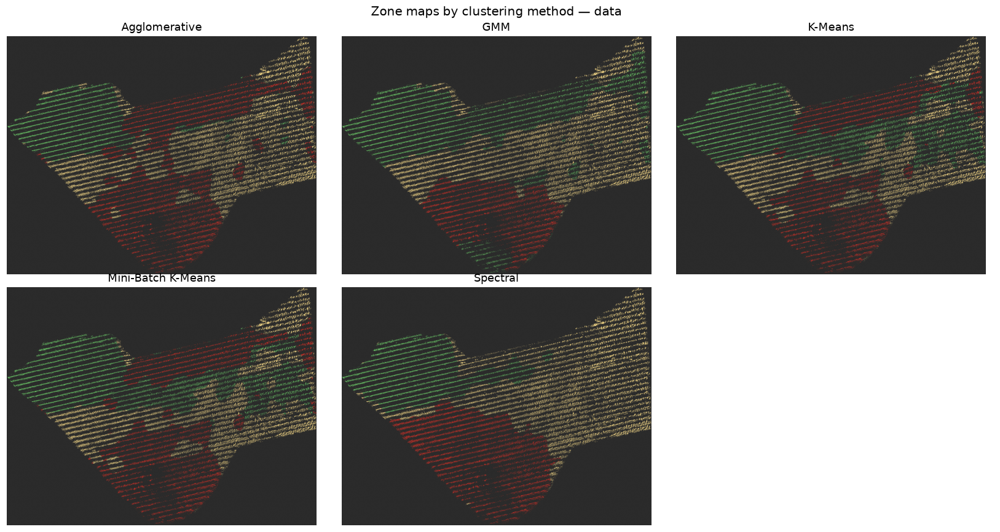

In [10]:
method_comparison("data")

---
# PART B — Dataset `data2` (OpenDroneMap orthophoto, no DEM)
Same flow via the ODM adapter; the slope / A\* elevation stage is skipped.

## B1. Management zones

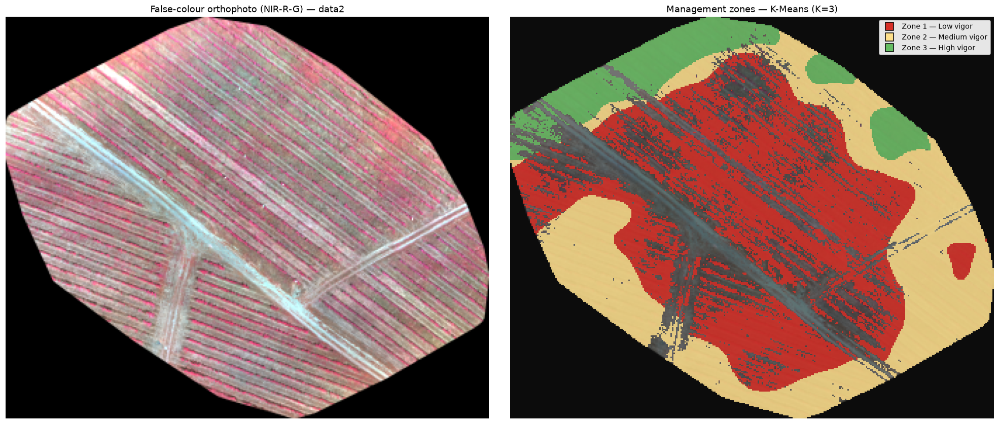

In [11]:
d2 = load_ds("data2")
show_zones(d2)

## B2. Per-zone statistics

In [12]:
zone_table(d2)

,Vigor,Pixels,Area [ha],% vegetation,Mean NDRE,Mean NDVI
Zone,,,,,,
1,Low vigor,"23,245",0.285,47.0,0.118,0.539
2,Medium vigor,"19,791",0.242,40.0,0.137,0.529
3,High vigor,"6,436",0.079,13.0,0.138,0.558


## B3. Clustering → path planning stages

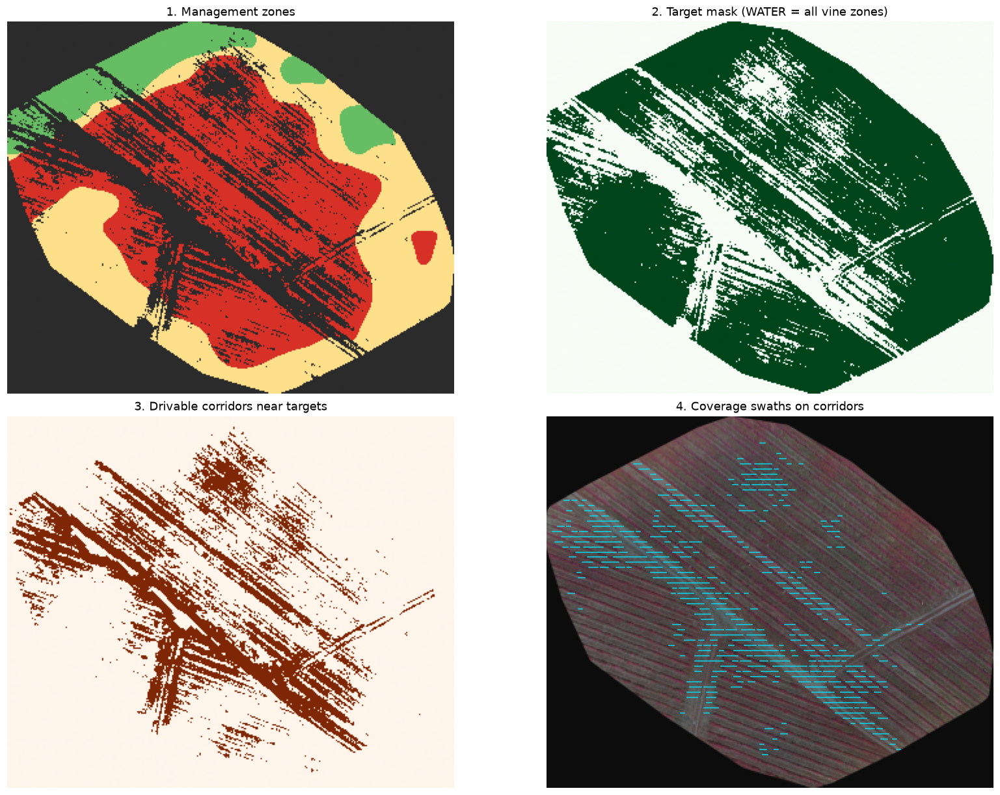

In [13]:
show_stages(d2)

## B4. Coverage path — WATER

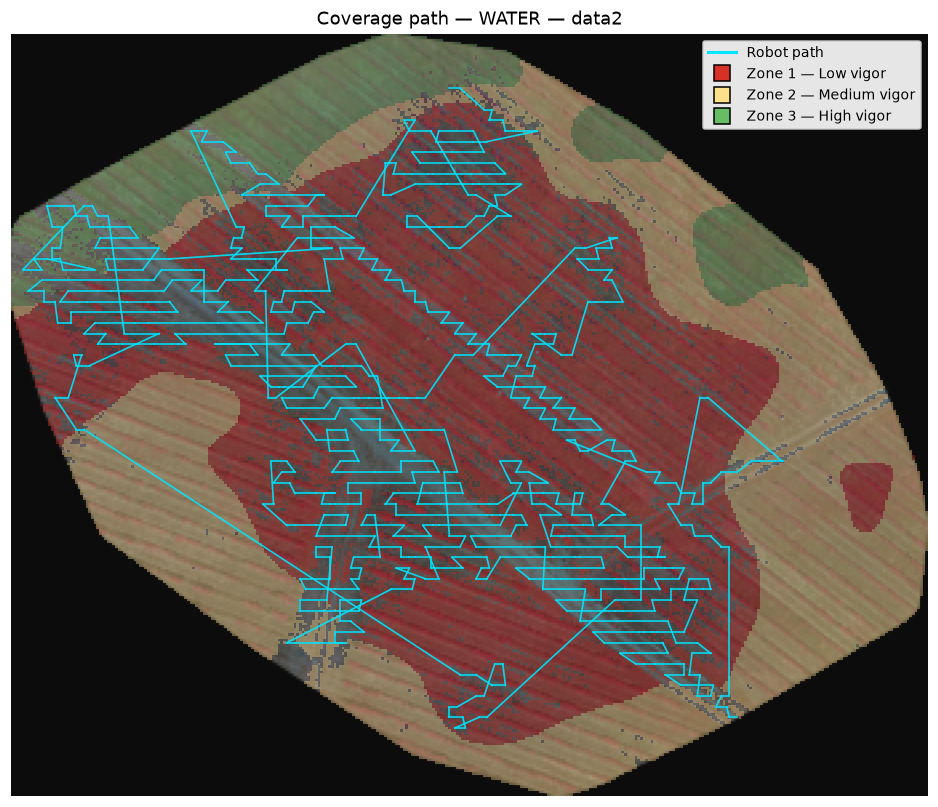

WATER: 703 segments, driven length ~= 1994 m


In [14]:
show_mission(d2, "water", "#00e5ff")

## B5. Coverage path — NITROGEN

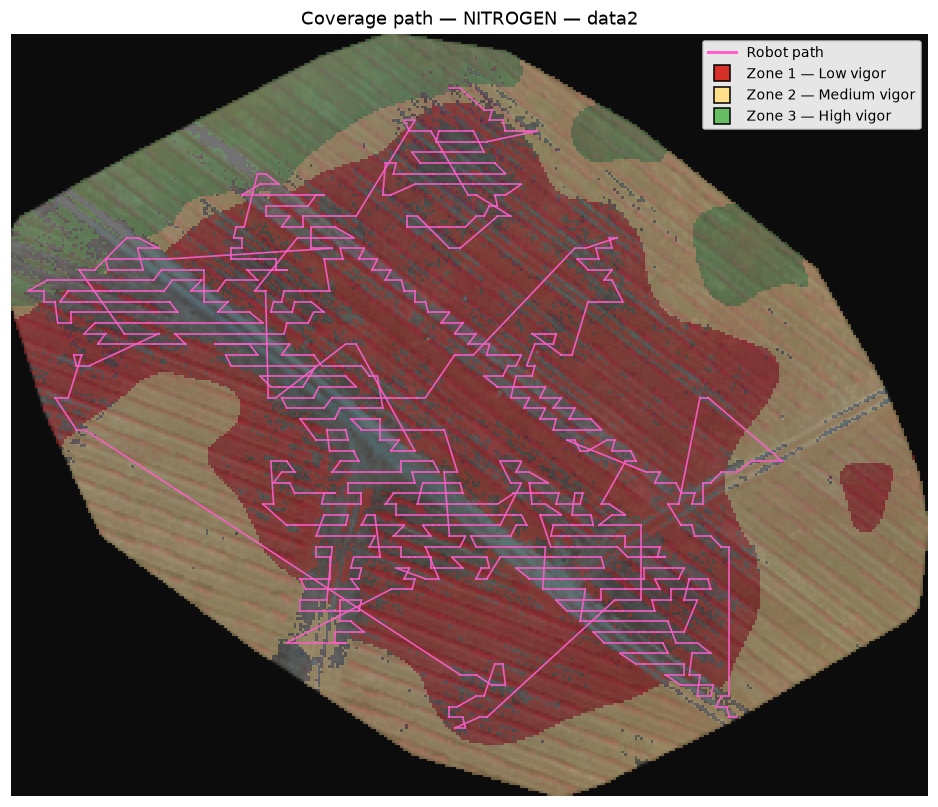

NITROGEN: 667 segments, driven length ~= 1906 m


In [15]:
show_mission(d2, "nitrogen", "#ff5ecb")

## B6. Method comparison

,Silhouette,Davies-Bouldin,Calinski-Harabasz,Balance,Fragmentation
Method,,,,,
Agglomerative,0.346000,1.070000,33660,0.243000,11.220000
GMM,0.299000,1.251000,24381,0.252000,11.600000
K-Means,0.346000,1.083000,34146,0.277000,11.140000
Mini-Batch K-Means,0.345000,1.085000,34130,0.286000,11.120000
Spectral,0.348000,1.060000,33200,0.220000,11.020000


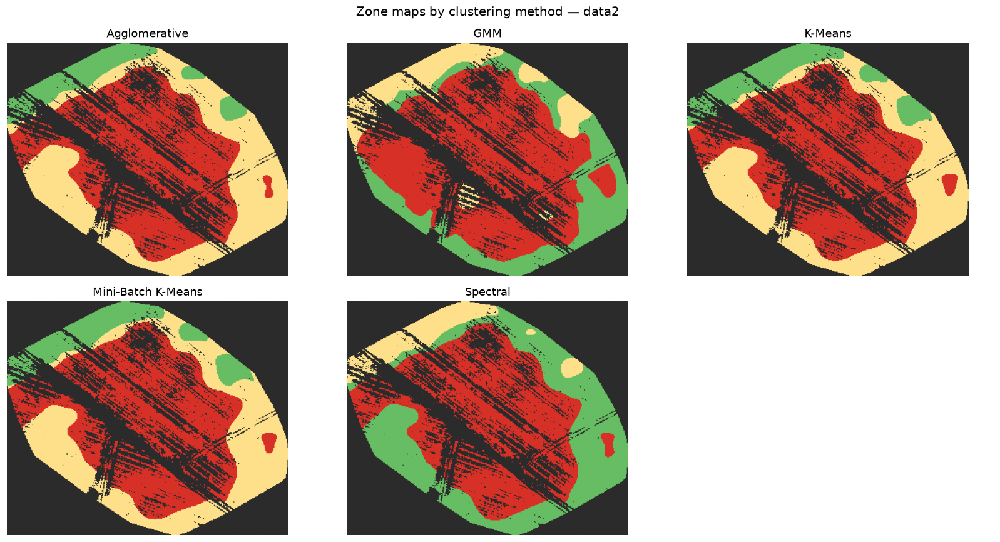

In [16]:
method_comparison("data2")

---
# Methodology notes
* **run_pipeline.py** is the end-to-end run; the colleague's original
  `pipeline.py` is kept untouched. All reporting code is in this notebook.
* **Representative training** on the full decimated vegetation distribution
  (a sparse spatial sample collapses K=3 into an empty high-vigor zone).
* **Contiguous zones** from clustering a spatially smoothed vigor surface, with
  soil left drivable.
* **CaSP is a no-op** on this data (largest patch < its 5000-px threshold);
  the smoothing above replaces it.
* **Slope from a smoothed DEM** — a per-pixel gradient on a centimetre DEM is
  pure noise; a ~2 m baseline recovers the true gentle terrain (median ~3°).
* **Path planning** keeps the robot on bare-soil corridors next to the zones
  that need treatment, and can route transitions with a slope-aware A\*.